Loads full res wrapped igram from 2 SLCs, plot it and plot its corresponding unwrapped igram. <br> <br>

NB written 5-25-23

***

In [1]:
import os,sys
import glob
import pandas as pd
import math
import scipy
from osgeo import gdal
import numpy as np
from array import array
from scipy  import signal
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy.stats import gaussian_kde
%matplotlib  widget

Load dates.

In [2]:
# load in dates
workdir = '/data/ocp4/LagunaSalada/Data_and_Figs/cropped_9000_1800_18000_3600/'
dates = [os.path.basename(x) for x in glob.glob(workdir+"SLC_vv/2*")]
dates = sorted(dates)
nd = len(dates); numIgrams = nd-1

Which dates/igrams have large baselines?

igrams with large baselines: 
[ 47  50  54  58  66  73  75  82  88  89  93  94  95  99 100 105 106 110
 111 114 139 143 144 149 150 151 152 156 157 158 162 163 164 168 169 170]

In [3]:
large_BL_igrams = [47,50,54,58,66,73,75,82,88,89,93,94,95,99,100,105,106,110,111,114,139,143,144,149,150,151,152,156,157,158,162,163,164,168,169,170]
#np.find()

Load in baselines.txt so I know corresponding baselines for each igram.

In [4]:
file = '/data/ocp4/LagunaSalada/Data_and_Figs/cropped_9000_1800_18000_3600/baselines/baselines.txt'
baselines = np.loadtxt(file, delimiter='\n', dtype='float')

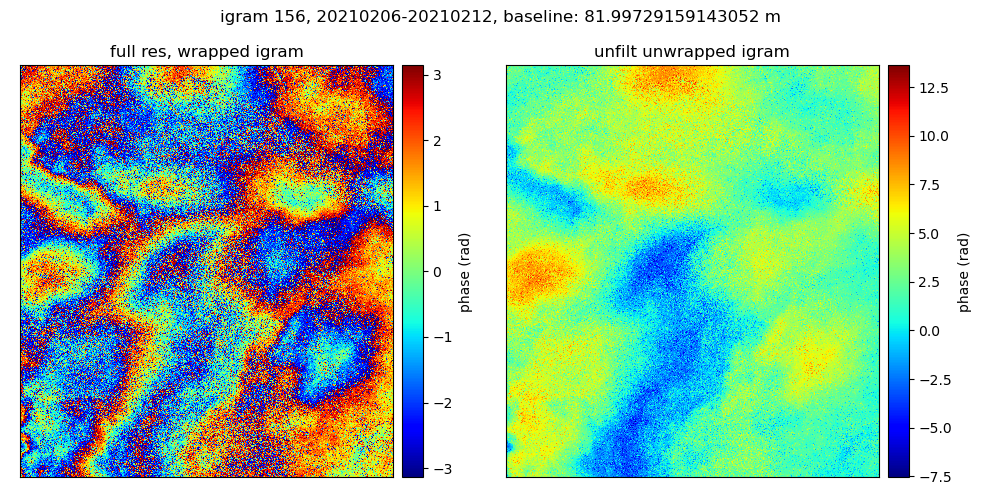

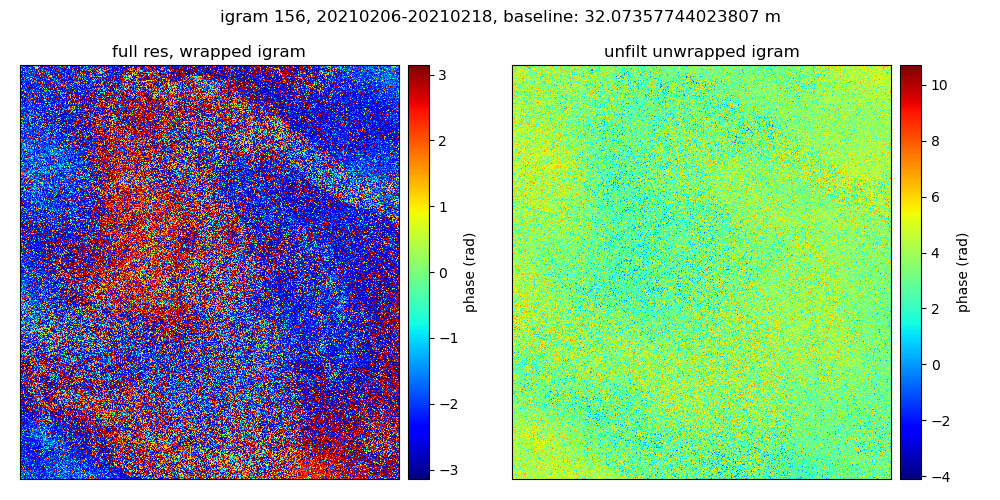

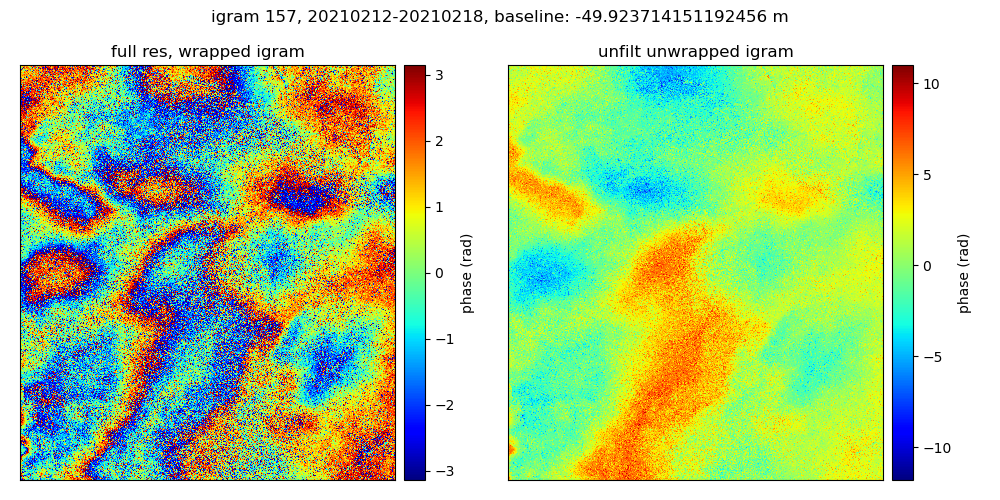

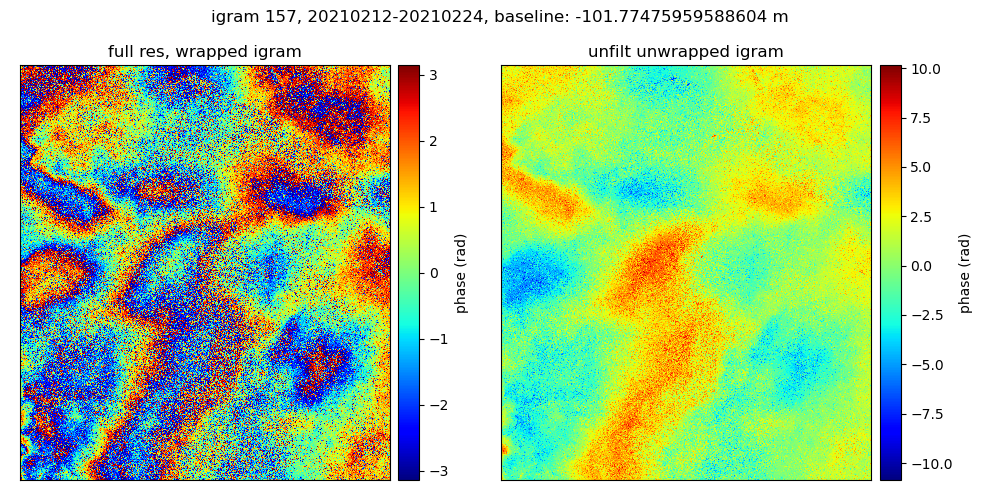

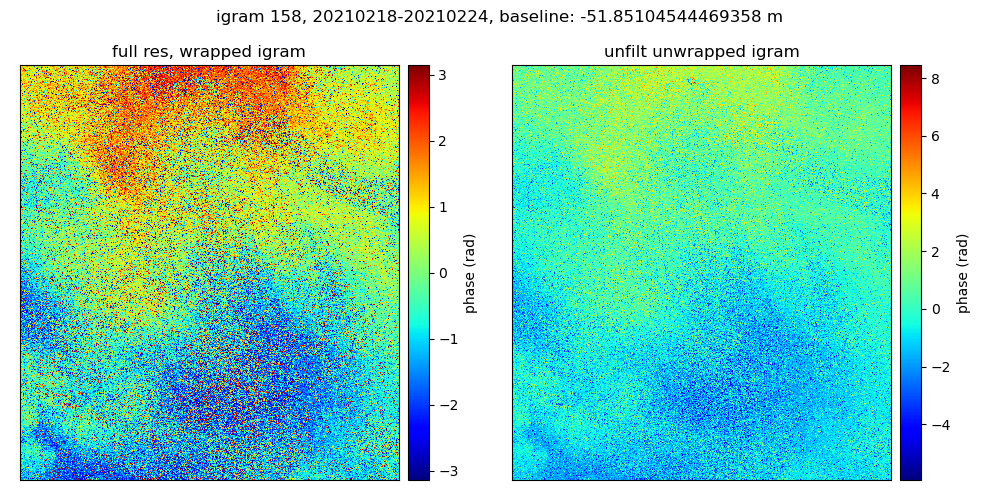

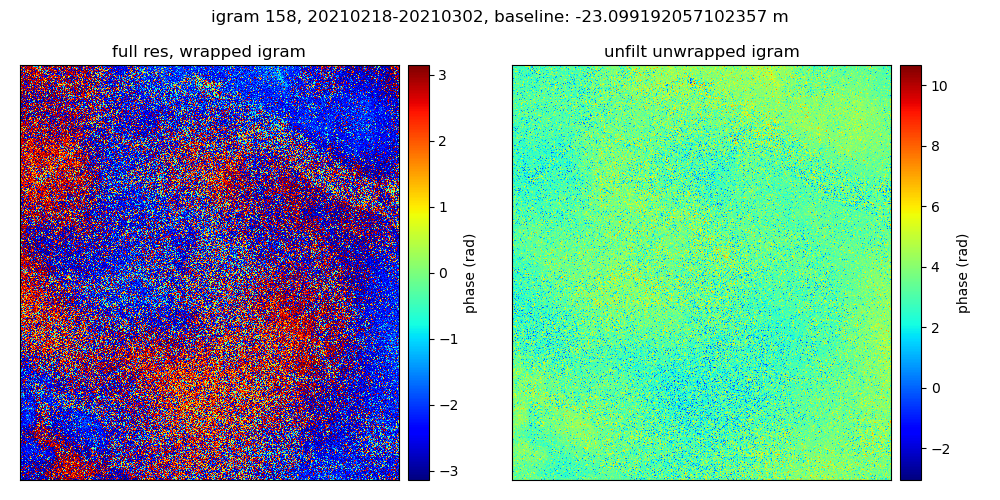

In [5]:
# size of full res SLCs, larger cropped region
x1 = 18000; x2 = 14000
y1 = 2100;  y2 = 1000
# output file size
dx = x1-x2
dy = y1-y2

# loop through large BL igrams, load full res igram and load the unwrapped one and plot them all
for i in np.arange(27,30,1): # range(len(large_BL_igrams))
    date1=dates[large_BL_igrams[i]]
    date2=dates[large_BL_igrams[i]+1]
    # Read in 2 full SLCs to make full res interferogram 
    ds = gdal.Open(workdir+"SLC_vv/"+date1+"/"+date1+".slc.full", gdal.GA_ReadOnly)
    slc1 = ds.GetRasterBand(1).ReadAsArray(x2,y2,dx,dy)
    ds = gdal.Open(workdir+"SLC_vv/"+date2+"/"+date2+".slc.full", gdal.GA_ReadOnly)
    slc2 = ds.GetRasterBand(1).ReadAsArray(x2,y2,dx,dy)
    int = (slc1*np.conj(slc2))
    # Read in the unfilt unwrapped igram
    ds = gdal.Open(workdir+"cropped_LS_with_western_mtns/unfilt_unwrapped/"+date1+"_"+date2+"_unfilt.unw", gdal.GA_ReadOnly)
    unw = ds.GetRasterBand(1).ReadAsArray(0,0,dx,dy)
    # plot both
    plt.figure(figsize=(10,5),tight_layout=True)
    plt.subplot(1,2,1)
    plt.imshow(np.angle(int),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
    plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)')
    plt.set_cmap('jet')
    plt.xlim([dx,0]); plt.ylim([dy,0])
    plt.xticks([]); plt.yticks([])
    plt.title('full res, wrapped igram')
    plt.subplot(1,2,2)
    plt.imshow(unw,aspect='auto',interpolation='nearest')
    plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)')
    plt.set_cmap('jet')
    plt.xlim([dx,0]); plt.ylim([dy,0])
    plt.xticks([]); plt.yticks([])
    plt.title('unfilt unwrapped igram')
    plt.suptitle('igram '+str(large_BL_igrams[i])+', '+date1+'-'+date2+', baseline: '+str(baselines[i+1]-baselines[i])+' m')
    plt.show()

    # do the same thing but for the skip1 igram
    date2=dates[large_BL_igrams[i]+2]
    # Read in the skip1 SLC
    ds = gdal.Open(workdir+"SLC_vv/"+date2+"/"+date2+".slc.full", gdal.GA_ReadOnly)
    slc2 = ds.GetRasterBand(1).ReadAsArray(x2,y2,dx,dy)
    int = (slc1*np.conj(slc2))
    # Read in the unfilt unwrapped igram
    ds = gdal.Open(workdir+"cropped_LS_with_western_mtns/unfilt_unwrapped/"+date1+"_"+date2+"_unfilt.unw", gdal.GA_ReadOnly)
    unw = ds.GetRasterBand(1).ReadAsArray(0,0,dx,dy)
    # plot both
    plt.figure(figsize=(10,5),tight_layout=True)
    plt.subplot(1,2,1)
    plt.imshow(np.angle(int),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
    plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)')
    plt.set_cmap('jet')
    plt.xlim([dx,0]); plt.ylim([dy,0])
    plt.xticks([]); plt.yticks([])
    plt.title('full res, wrapped igram')
    plt.subplot(1,2,2)
    plt.imshow(unw,aspect='auto',interpolation='nearest')
    plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)')
    plt.set_cmap('jet')
    plt.xlim([dx,0]); plt.ylim([dy,0])
    plt.xticks([]); plt.yticks([])
    plt.title('unfilt unwrapped igram')
    plt.suptitle('igram '+str(large_BL_igrams[i])+', '+date1+'-'+date2+', baseline: '+str(baselines[i+2]-baselines[i])+' m')
    plt.show()

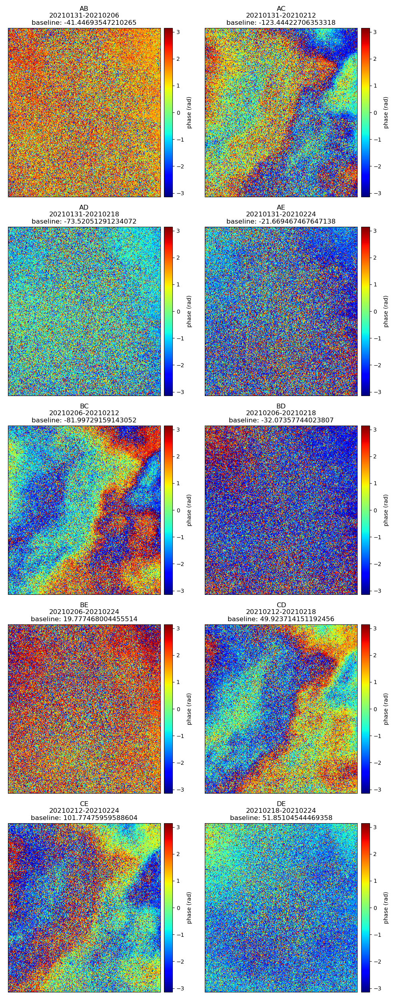

In [6]:
# size of full res SLCs, larger cropped region
x1 = 18000; x2 = 14000
y1 = 2100;  y2 = 1000
# output file size
dx = x1-x2
dy = y1-y2

# only picking from large baseline (sequential) igrams to further investigate.
i = 28
A = i-2; B = i-1; C = i; D = i+1; E = i+2
dateA = dates[large_BL_igrams[i]-2]
dateB = dates[large_BL_igrams[i]-1]
dateC = dates[large_BL_igrams[i]]
dateD = dates[large_BL_igrams[i]+1]
dateE = dates[large_BL_igrams[i]+2]
# Read in 2 full SLCs to make full res interferogram 
ds = gdal.Open(workdir+"SLC_vv/"+dateA+"/"+dateA+".slc.full", gdal.GA_ReadOnly)
slcA = ds.GetRasterBand(1).ReadAsArray(x2,y2,dx,dy)
ds = gdal.Open(workdir+"SLC_vv/"+dateB+"/"+dateB+".slc.full", gdal.GA_ReadOnly)
slcB = ds.GetRasterBand(1).ReadAsArray(x2,y2,dx,dy)
ds = gdal.Open(workdir+"SLC_vv/"+dateC+"/"+dateC+".slc.full", gdal.GA_ReadOnly)
slcC = ds.GetRasterBand(1).ReadAsArray(x2,y2,dx,dy)
ds = gdal.Open(workdir+"SLC_vv/"+dateD+"/"+dateD+".slc.full", gdal.GA_ReadOnly)
slcD = ds.GetRasterBand(1).ReadAsArray(x2,y2,dx,dy)
ds = gdal.Open(workdir+"SLC_vv/"+dateE+"/"+dateE+".slc.full", gdal.GA_ReadOnly)
slcE = ds.GetRasterBand(1).ReadAsArray(x2,y2,dx,dy)
# make full res igrams 
intAB = (slcA*np.conj(slcB))
intAC = (slcA*np.conj(slcC))
intAD = (slcA*np.conj(slcD))
intAE = (slcA*np.conj(slcE))
intBC = (slcB*np.conj(slcC))
intBD = (slcB*np.conj(slcD))
intBE = (slcB*np.conj(slcE))
intCD = (slcC*np.conj(slcD))
intCE = (slcC*np.conj(slcE))
intDE = (slcD*np.conj(slcE))

plt.figure(figsize=(10,25),tight_layout=True)
plt.subplot(5,2,1)
plt.imshow(np.angle(intAB),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)'); plt.set_cmap('jet')
plt.xlim([2500,1000]); plt.ylim([1000,600]); 
plt.xticks([]); plt.yticks([])
plt.title('AB\n'+dateA+'-'+dateB+'\nbaseline: '+str(baselines[A]-baselines[B]))
plt.subplot(5,2,2)
plt.imshow(np.angle(intAC),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)'); plt.set_cmap('jet')
#plt.xlim([dx,0]); plt.ylim([dy,0]); 
plt.xlim([2500,1000]); plt.ylim([1000,600]); 
plt.xticks([]); plt.yticks([])
plt.title('AC\n'+dateA+'-'+dateC+'\nbaseline: '+str(baselines[A]-baselines[C]))
plt.subplot(5,2,3)
plt.imshow(np.angle(intAD),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)'); plt.set_cmap('jet')
plt.xlim([2500,1000]); plt.ylim([1000,600]); 
plt.xticks([]); plt.yticks([])
plt.title('AD\n'+dateA+'-'+dateD+'\nbaseline: '+str(baselines[A]-baselines[D]))
plt.subplot(5,2,4)
plt.imshow(np.angle(intAE),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)'); plt.set_cmap('jet')
plt.xlim([2500,1000]); plt.ylim([1000,600]); 
plt.xticks([]); plt.yticks([])
plt.title('AE\n'+dateA+'-'+dateE+'\nbaseline: '+str(baselines[A]-baselines[E]))
plt.subplot(5,2,5)
plt.imshow(np.angle(intBC),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)'); plt.set_cmap('jet')
plt.xlim([2500,1000]); plt.ylim([1000,600]); 
plt.xticks([]); plt.yticks([])
plt.title('BC\n'+dateB+'-'+dateC+'\nbaseline: '+str(baselines[B]-baselines[C]))
plt.subplot(5,2,6)
plt.imshow(np.angle(intBD),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)'); plt.set_cmap('jet')
plt.xlim([2500,1000]); plt.ylim([1000,600]);  
plt.xticks([]); plt.yticks([])
plt.title('BD\n'+dateB+'-'+dateD+'\nbaseline: '+str(baselines[B]-baselines[D]))
plt.subplot(5,2,7)
plt.imshow(np.angle(intBE),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)'); plt.set_cmap('jet')
plt.xlim([2500,1000]); plt.ylim([1000,600]);  
plt.xticks([]); plt.yticks([])
plt.title('BE\n'+dateB+'-'+dateE+'\nbaseline: '+str(baselines[B]-baselines[E]))
plt.subplot(5,2,8)
plt.imshow(np.angle(intCD),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)'); plt.set_cmap('jet')
plt.xlim([2500,1000]); plt.ylim([1000,600]);  
plt.xticks([]); plt.yticks([])
plt.title('CD\n'+dateC+'-'+dateD+'\nbaseline: '+str(baselines[C]-baselines[D]))
plt.subplot(5,2,9)
plt.imshow(np.angle(intCE),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)'); plt.set_cmap('jet')
plt.xlim([2500,1000]); plt.ylim([1000,600]); 
plt.xticks([]); plt.yticks([])
plt.title('CE\n'+dateC+'-'+dateE+'\nbaseline: '+str(baselines[C]-baselines[E]))
plt.subplot(5,2,10)
plt.imshow(np.angle(intDE),aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.colorbar(orientation='vertical',pad=0.02,label='phase (rad)'); plt.set_cmap('jet')
plt.xlim([2500,1000]); plt.ylim([1000,600]); 
plt.xticks([]); plt.yticks([])
plt.title('DE\n'+dateD+'-'+dateE+'\nbaseline: '+str(baselines[D]-baselines[E]))
plt.show()